In [2]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

from ario3.simulation import Simulation
from ario3.indicators import Indicators
import json
import pandas as pd
import numpy as np
import pathlib
import csv

params = {
    "storage_dir": "../../../Data/BigScaleTest/",
    "results_storage": "results",
    "bool_run_detailled": True,
    "register_stocks": True,
    "psi_param": 0.9,
    "model_time_step": 1,
    "timestep_dividing_factor": 365,
    "inventory_restoration_time": 40,
    "alpha_base": 1.0,
    "alpha_max": 1.25,
    "alpha_tau": 365,
    "rebuild_tau": 150000,
    "n_timesteps": 365,
    "min_duration": 25,
    "impacted_region_base_production_toward_rebuilding": 0.0,
    "row_base_production_toward_rebuilding": 0.0,
    "mrio_params_file": "/home/sjuhel/Nextcloud/Thesis/Workbench/Data/BigScaleTest/mrio_params.json"
}

event_template = {
    "aff-regions": [
        "JP"
    ],
    "aff-sectors": [
        "Mining of coal and lignite; extraction of peat (10)",
        "Extraction of crude petroleum, gas and other",
        "Mining of uranium and thorium ores (12)",
        "Mining of iron ores",
        "Mining of copper ores and concentrates",
        "Mining of nickel ores and concentrates",
        "Mining of aluminium ores and concentrates",
        "Mining of precious metal ores and concentrates",
        "Mining of lead, zinc and tin ores and concentrates",
        "Mining of other non-ferrous metal ores and concentrates",
        "Quarrying",
        "Manufacture of textile and wearing apparel (17,18)",
        "Manufacture of wood and of products of wood and cork, except furniture; manufacture of articles of straw and plaiting materials (20)",
        "Manufacture of coke oven products",
        "Petroleum Refinery",
        "Processing of nuclear fuel",
        "Plastics, basic",
        "Fertilisers",
        "Chemicals nec",
        "Manufacture of rubber and plastic products (25)",
        "Manufacture of glass and glass products",
        "Manufacture of ceramic goods",
        "Manufacture of construction products and cement",
        "Manufacture of other non-metallic mineral products n.e.c.",
        "Manufacture of basic iron and steel and of ferro-alloys and first products thereof",
        "Precious metals production",
        "Aluminium production",
        "Lead, zinc and tin production",
        "Copper production",
        "Other non-ferrous metal production",
        "Casting of metals",
        "Manufacture of fabricated metal products, except machinery and equipment (28)",
        "Manufacture of machinery and equipment n.e.c. (29)",
        "Manufacture of office machinery and computers (30)",
        "Manufacture of electrical machinery and apparatus n.e.c. (31)",
        "Manufacture of medical, precision and optical instruments, watches and clocks (33)",
        "Manufacture of transport equipment (34,35)",
        "Manufacture of furniture; manufacturing n.e.c. (36)",
        "Recycling of waste and scrap",
        "Transmission and distribution of electricity",
        "Transport via railways",
        "Other land transport",
        "Post and telecommunications (64)"
    ],
    "dmg-distrib-regions": [
        1
    ],
    "dmg-distrib-sectors-type": "gdp",
    "dmg-distrib-sectors": [],
    "duration": 1,
    "name": "0",
    "occur": 5,
    "q_dmg": 50000000000,
    "rebuilding-sectors": {
        "Public administration and defence; compulsory social security, Education and Health (75,80,85)": 0.24,
        "Construction (45)": 0.24,
        "Manufacture of wood and of products of wood and cork, except furniture; manufacture of articles of straw and plaiting materials (20)": 0.05,
        "Manufacture of construction products and cement": 0.05,
        "Manufacture of office machinery and computers (30)": 0.023,
        "Other land transport": 0.046,
        "Manufacture of electrical machinery and apparatus n.e.c. (31)": 0.08,
        "Financial intermediation, insurance and pension funding (65)": 0.024,
        "Manufacture of furniture; manufacturing n.e.c. (36)": 0.06,
        "Manufacture of textile and wearing apparel (17,18)": 0.011,
        "Manufacture of machinery and equipment n.e.c. (29)": 0.01,
        "Chemicals nec": 0.005,
        "Retail sale of automotive fuel": 0.005,
        "Processing of food products nec": 0.003,
        "Manufacture of ceramic goods": 0.0009,
        "Manufacture of medical, precision and optical instruments, watches and clocks (33)": 0.002,
        "Cultivation in general": 5e-05,
        "Animal farming": 5e-05,
        "Sale, maintenance, repair of motor vehicles, motor vehicles parts, motorcycles, motor cycles parts and accessoiries": 0.05,
        "Retail trade, except of motor vehicles and motorcycles; repair of personal and household goods (52)": 0.05,
        "Wholesale trade and commission trade, except of motor vehicles and motorcycles (51)": 0.05
    }
}

# Fully display a dataframe (all lines and columns)
def display_f(df):
    with pd.option_context('display.max_colwidth', None), pd.option_context('display.max_rows', None), pd.option_context('display.max_columns', None):
        display(df)

In [8]:
import pymrio as pym
import pickle
from ario3.mriosystem import lexico_reindex

mrio_path = pathlib.Path(params['storage_dir'])/"mrio.pkl" 
exio = pickle.load(mrio_path.open('rb'))

VA_idx = np.array(['Taxes less subsidies on products purchased: Total',
       'Other net taxes on production',
       "Compensation of employees; wages, salaries, & employers' social contributions: Low-skilled",
       "Compensation of employees; wages, salaries, & employers' social contributions: Medium-skilled",
       "Compensation of employees; wages, salaries, & employers' social contributions: High-skilled",
       'Operating surplus: Consumption of fixed capital',
       'Operating surplus: Rents on land',
       'Operating surplus: Royalties on resources',
       'Operating surplus: Remaining net operating surplus'], dtype=object)

exio = lexico_reindex(exio)

df = exio.satellite.F
df = df.loc[VA_idx]

df = df.sum(axis=0)
gdp_df = df.groupby('region').sum()

gdp_df_pct = gdp_df*1000000

#print(exio.x.T[('FR','Construction (45)')].values[0]*1000000/365)
#print(df[('FR','Construction (45)')])
#(exio.x.groupby('region').sum() / 365).loc['FR']*1000000*0.0001
gdp_df_pct['JP']*0.0002

907988532.5431453

In [52]:
value_added = (exio.x.T - exio.Z.sum(axis=0))
value_added = value_added.reindex(sorted(value_added.index), axis=0) #type: ignore
value_added = value_added.reindex(sorted(value_added.columns), axis=1)
value_added[value_added < 0] = 0.0
value_added.T.groupby('region').sum()

,indout
region,
AT,3.975816e+05
AU,1.232879e+06
BE,4.762579e+05
BG,6.067492e+04
BR,1.650555e+06
CA,1.555602e+06
CH,6.533501e+05
CN,1.281191e+07
CY,2.194310e+04


In [34]:
df = exio.x[((exio.x.T - exio.Z.sum(axis=0)) < 0).any()]
a = exio.Z.sum(axis=0).T[((exio.x.T - exio.Z.sum(axis=0)) < 0).any()].values

df = df.reset_index()
df['intmd'] = a
df

,region,sector,indout,intmd
0,AT,Transport via pipelines,1130.900545,1146.272350
1,BE,Transport via pipelines,702.238919,767.639593
2,CY,Manufacture of coke oven products,0.263251,0.263251
3,DK,Mining of other non-ferrous metal ores and con...,0.238053,0.239175
4,DK,Sea and coastal water transport,16674.048583,17327.438561
5,ID,Processing of nuclear fuel,1.082433,1.345404
6,IE,Transport via pipelines,222.598108,317.843138
7,JP,"Extraction of crude petroleum, gas and other",1393.726943,1967.915431
8,JP,Mining of iron ores,0.673741,1.229948
9,JP,Recycling of waste and scrap,8323.673363,8455.258208


In [ ]:
VA_idx = np.array(['Taxes less subsidies on products purchased: Total',
       'Other net taxes on production',
       "Compensation of employees; wages, salaries, & employers' social contributions: Low-skilled",
       "Compensation of employees; wages, salaries, & employers' social contributions: Medium-skilled",
       "Compensation of employees; wages, salaries, & employers' social contributions: High-skilled",
       'Operating surplus: Consumption of fixed capital',
       'Operating surplus: Rents on land',
       'Operating surplus: Royalties on resources',
       'Operating surplus: Remaining net operating surplus'], dtype=object)

VA_idx2 = np.array([
    "Compensation of employees; wages, salaries, & employers' social contributions: Low-skilled",
       "Compensation of employees; wages, salaries, & employers' social contributions: Medium-skilled",
       "Compensation of employees; wages, salaries, & employers' social contributions: High-skilled",
       'Operating surplus: Consumption of fixed capital'
], dtype=object)

VA_idx3 = np.array(['Taxes less subsidies on products purchased: Total',
       'Other net taxes on production',
       "Compensation of employees; wages, salaries, & employers' social contributions: Low-skilled",
       "Compensation of employees; wages, salaries, & employers' social contributions: Medium-skilled",
       "Compensation of employees; wages, salaries, & employers' social contributions: High-skilled",
       'Operating surplus: Consumption of fixed capital'
                   ], dtype=object)

VA_idx4 = np.array(['Taxes less subsidies on products purchased: Total',
       'Other net taxes on production',
       "Compensation of employees; wages, salaries, & employers' social contributions: Low-skilled",
       "Compensation of employees; wages, salaries, & employers' social contributions: Medium-skilled",
       "Compensation of employees; wages, salaries, & employers' social contributions: High-skilled",
       'Operating surplus: Consumption of fixed capital',
       'Operating surplus: Rents on land',
       'Operating surplus: Royalties on resources'
                   ], dtype=object)


df = exio.satellite.F
display_f(df.groupby(['region','sector'],axis=1).sum().loc[VA_idx,'JP'].sum(axis=0))#.loc[event_template['aff-sectors']]
#print((df.groupby(['region'],axis=1).sum().loc[VA_idx2,'JP']*1000000).sum())
#print((df.groupby(['region'],axis=1).sum().loc[VA_idx3,'JP']*1000000).sum())
#print((df.groupby(['region'],axis=1).sum().loc[VA_idx4,'JP']*1000000).sum())

In [179]:
df
#display_f(pd.Series(model.mrio.kapital_lost, index=df.index)['JP'].sort_values())
#isplay_f(pd.Series(model.mrio.rebuilding_demand.sum(axis=0).sum(axis=0), index=df.index)['JP'].sort_values())
model.events[0].dmg_distrib_across_sectors_type
regions_idx = np.arange(model.mrio.regions.size)
aff_regions_idx = np.searchsorted(model.mrio.regions, event_template['aff-regions'])
n_regions_aff = aff_regions_idx.size
aff_sectors_idx = np.searchsorted(model.mrio.sectors, event_template['aff-sectors'])
n_sectors_aff = aff_sectors_idx.size
aff_industries_idx = np.array([model.mrio.n_sectors * ri + si for ri in aff_regions_idx for si in aff_sectors_idx])
q_dmg = event_template['q_dmg'] / 1000000
q_dmg_regions = np.array([1.0]) * q_dmg
#for region_idx in aff_regions_idx:
#    aff_sectors_idx[(shares[region_idx][aff_sectors_idx] < 0)]
shares = model.mrio.gdp_share_sector.reshape((model.mrio.n_regions,model.mrio.n_sectors))
q_dmg_regions_sectors = q_dmg_regions * (shares[aff_regions_idx][:,aff_sectors_idx]/shares[aff_regions_idx][:,aff_sectors_idx].sum(axis=1)[:,np.newaxis])
aff_sectors_idx
#(shares[aff_regions_idx][:,aff_sectors_idx]/shares[aff_regions_idx][:,aff_sectors_idx].sum(axis=1)[:,np.newaxis])
model.mrio.sectors
event_template['aff-sectors']
(model.mrio.gdp_share_sector).shape
q_dmg_regions_sectors[q_dmg_regions_sectors < 0] = 0
q_dmg_regions_sectors

array([[8.91204053e-01, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        5.32118462e-03, 0.00000000e+00, 0.00000000e+00, 7.03848549e-01,
        0.00000000e+00, 2.78413386e-01, 1.03751302e+02, 5.83393074e+02,
        3.09330117e+02, 5.50022032e+01, 3.27823084e+03, 1.02520706e+01,
        1.56400471e+02, 2.74213019e+01, 3.12349759e+03, 1.85992993e+03,
        2.51374650e+02, 1.44085351e+02, 5.41241326e+01, 5.76273869e+02,
        1.68987600e+03, 3.71236956e+01, 1.94177644e+02, 2.28798678e+01,
        1.15507127e+02, 1.14980012e+02, 1.72244778e+02, 2.29159882e+03,
        5.61803869e+03, 3.48668625e+03, 2.29482013e+03, 1.22673594e+03,
        5.31897176e+03, 6.97209907e+02, 0.00000000e+00, 7.07729285e+02,
        2.68925611e+03, 5.69131585e+03, 7.12602152e+03]])

In [175]:
aff_regions_idx = np.array([24,25])

    print()

[ 9 40 62]
[39 44 41 43 57]


In [ ]:
df2 = pd.DataFrame(df, columns=['exio'])
df2['model'] = model.mrio.VA_0
df2['kapital'] = df2['exio'] * model.mrio.kstock_ratio_to_VA
df2 = df2.loc['JP']
df2 = df2.loc[reb_sec]
test = [(50*10**9 / 10**6) * v for v in event_template['rebuilding-sectors'].values()]
df2['dmg'] = test
df2

In [ ]:
tmp = df.values * 1000000 * model.mrio.kstock_ratio_to_VA
tmp = pd.Series(data=tmp.T, index=pd.MultiIndex.from_product([exio.get_regions(), exio.get_sectors()]))
tmp = tmp['FR']

tmp = tmp.loc[reb_sec]
tmp = pd.DataFrame(tmp, columns=["Kapital"])
tmp['dmg'] = test
tmp

,indout
sector,
Air transport (62),34462.508951
Aluminium production,19280.113721
Animal farming,19711.938217
Casting of metals,19131.093468
Chemicals nec,256708.494392
...,...
Transmission and distribution of electricity,37766.645139
Transport via pipelines,1000.471987
Transport via railways,83628.231837


In [3]:
model = Simulation(params, mrio_path)
model.read_events_from_list([event_template])
model.shock(model.events[0])

18:31:08 [INFO] - [simulation.py > __init__() > 57] - Initializing new simulation instance
18:31:09 [DEBUG] - [mriosystem.py > __init__() > 124] - Initiating new MrioSystem instance
18:31:09 [INFO] - [mriosystem.py > __init__() > 142] - Monetary unit is: 1000000
18:31:09 [INFO] - [simulation.py > __init__() > 130] - Initialized !
18:31:10 [INFO] - [simulation.py > read_events_from_list() > 275] - Reading events from given list and adding them to the model
18:31:10 [INFO] - [simulation.py > shock() > 309] - Shocking model with new event
18:31:10 [INFO] - [simulation.py > shock() > 310] - Affected regions are : ['JP']
18:31:10 [INFO] - [simulation.py > shock() > 325] - Damages are 50000.0 times 1000000 [unit (ie $/€/£)]


In [7]:
#pd.Series(model.mrio.kapital_lost, index=pd.MultiIndex.from_product([exio.get_regions(), exio.get_sectors()]))['JP']
model.mrio.calc_production_cap()

In [26]:
from datetime import datetime

res = []
model = None
for psi in [0.9]:
    for inv_tau in [40]:
        for qdmg in [0.01]:
            for region_aff in ['FR']:
                dmg = gdp_df_pct[region_aff] * qdmg
                event = event_template.copy()
                sim_params = params.copy()
                event['aff-regions'] = region_aff
                event['q_dmg'] = dmg
                sim_params['psi_param'] = psi
                sim_params['inventory_restoration_time'] = inv_tau
                sim_params["results_storage"] = params["results_storage"]+"/"+region_aff+'_'+'qdmg_'+str(dmg/1000000000).replace(".","_")+"G"+'_Psi_'+str(sim_params['psi_param']).replace(".","_")+"_inv_tau_"+str(sim_params['inventory_restoration_time'])
                if model is None:
                    model = Simulation(sim_params, mrio_path)
                else:
                    model.update_params(sim_params)
                    model.reset_sim_full()
                model.read_events_from_list([event])
                model.loop()
                final_step = model.current_t
                indic = Indicators.from_storage_path(pathlib.Path(sim_params['storage_dir']), params=sim_params)
                indic.update_indicators()
                res_a = indic.indicators.copy()
                indic.write_indicators()
                res_a['region'] = region_aff
                res_a['q_dmg'] = event['q_dmg']
                res_a['psi'] = psi
                res_a['inv_tau'] = inv_tau
                res.append(res_a)
#except KeyboardInterrupt:
#    with (pathlib.Path(params['storage_dir'])/("indicators_"+datetime.now().strftime("%Y%m%d-%H%M%S")+".csv")).open('w') as f:
#        w = csv.DictWriter(f, res[0].keys())
#        w.writeheader()
#        w.writerows(res)

#with (pathlib.Path(params['storage_dir'])/("indicators_"+datetime.now().strftime("%Y%m%d-%H%M%S")+".csv")).open('w') as f:
#    w = csv.DictWriter(f, res[0].keys())
#    w.writeheader()
#    w.writerows(res)

[INFO]:: ario3.mriosystem : Monetary unit is: 1000000


Processed: Year: 0  ~ N/A% ETA:  --:--:--                                      

{
    "storage_dir": "../../../Data/BigScaleTest/",
    "results_storage": "results/FR_qdmg_24_256527684033532G_Psi_0_9_inv_tau_40",
    "bool_run_detailled": true,
    "register_stocks": true,
    "psi_param": 0.9,
    "model_time_step": 1,
    "timestep_dividing_factor": 1,
    "inventory_restoration_time": 40,
    "alpha_base": 1.0,
    "alpha_max": 1.25,
    "alpha_tau": 365,
    "rebuild_tau": 150000,
    "n_timesteps": 365,
    "min_duration": 25,
    "impacted_region_base_production_toward_rebuilding": 0.0,
    "row_base_production_toward_rebuilding": 0.0,
    "mrio_params_file": "/home/sjuhel/Nextcloud/Thesis/Workbench/Data/BigScaleTest/mrio_params.json"
}


Processed: Year: 365  ~ 100% Time:  0:04:23                                    
Processed: Year: 365  ~ 100% Time:  0:04:23                                    

In [7]:
indic.df # 128103150
         #   9259236


,region,sector,step,variable,value
0,AT,Air transport (62),0,production,66.862724
1,AT,Air transport (62),1,production,66.862724
2,AT,Air transport (62),2,production,66.862724
3,AT,Air transport (62),3,production,66.862724
4,AT,Air transport (62),4,production,66.862724
...,...,...,...,...,...
9259231,ZA,"Wool, silk-worm cocoons",357,overprod,1.126986
9259232,ZA,"Wool, silk-worm cocoons",358,overprod,1.127323
9259233,ZA,"Wool, silk-worm cocoons",359,overprod,1.127659
9259234,ZA,"Wool, silk-worm cocoons",360,overprod,1.127994


In [3]:
psi=0.9
inv_tau= 90
qdmg=0.005
region_aff='BE'
dmg = gdp_df_pct[region_aff] * qdmg
event = event_template.copy()
sim_params = params.copy()
event['aff-regions'] = region_aff
event['q_dmg'] = dmg
sim_params['psi_param'] = psi
sim_params['inventory_restoration_time'] = inv_tau
sim_params["results_storage"] = params["results_storage"]+"/"+region_aff+'_'+'qdmg_'+str(dmg/1000000000).replace(".","_")+"G"+'_Psi_'+str(sim_params['psi_param']).replace(".","_")+"_inv_tau_"+str(sim_params['inventory_restoration_time'])
indic = Indicators.from_storage_path(pathlib.Path(sim_params['storage_dir']), params=sim_params)

In [8]:
indic.indicators

{'tot_fd_unmet': 383049.7694301166,
 'aff_fd_unmet': 285376.68185809045,
 'rebuild_durations': [98],
 'shortage_b': True,
 'shortage_date_start': 15,
 'shortage_date_end': 16,
 'shortage_date_max': 15,
 'shortage_ind_max': 0.3125,
 'shortage_ind_mean': 0.3125,
 'prod_gain_tot': 149851.72058900003,
 'prod_lost_tot': -974289.417256,
 'prod_gain_unaff': 52691.485761,
 'prod_lost_unaff': -165862.81283}

In [72]:
tmp = np.isclose(model.mrio.production_evolution[350] , model.mrio.production_evolution[340], atol=0.0001)
df2 = pd.DataFrame(model.mrio.production_evolution[350] - model.mrio.production_evolution[340], columns=["production"], index=pd.MultiIndex.from_product([indexes["regions"], indexes["sectors"]]))
df = pd.DataFrame(tmp, index=pd.MultiIndex.from_product([indexes["regions"], indexes["sectors"]]), columns=["production"])
df = ~df
df2.loc[:, df.any()].min().min()#.style.background_gradient(cmap='Reds')

nan

In [ ]:
with (pathlib.Path(params['storage_dir'])/("indicators_"+datetime.now().strftime("%Y%m%d-%H%M%S")+".csv")).open('w') as f:
    l = [len(r) for r in res]
    mx = max(l)
    idx =l.index(mx)
    w = csv.DictWriter(f, res[idx].keys())
    w.writeheader()
    w.writerows(res)

In [8]:
res

[{'tot_fd_unmet': 8164.446254794637,
  'aff_fd_unmet': 4895.075597981125,
  'rebuild_durations': [36],
  'shortage_b': True,
  'shortage_date_start': 16,
  'shortage_date_end': 17,
  'shortage_date_max': 16,
  'shortage_ind_max': 0.8463541666666666,
  'shortage_ind_mean': 0.8463541666666666,
  'prod_gain_tot': 5074.527479,
  'prod_lost_tot': -2196.0916740000002,
  'prod_gain_unaff': 2225.37604,
  'prod_lost_unaff': -341.244652,
  'region': 'GB',
  'q_dmg': 10000000000,
  'psi': 0.9,
  'inv_tau': 90},
 {'tot_fd_unmet': 13962.020274469747,
  'aff_fd_unmet': 9323.877453107783,
  'rebuild_durations': [31],
  'shortage_b': True,
  'shortage_date_start': 15,
  'shortage_date_end': 16,
  'shortage_date_max': 15,
  'shortage_ind_max': 3.2942708333333335,
  'shortage_ind_mean': 3.2942708333333335,
  'prod_gain_tot': 6061.840518000001,
  'prod_lost_tot': -14823.381813,
  'prod_gain_unaff': 3243.4543540000004,
  'prod_lost_unaff': -1885.9715300000003,
  'region': 'FR',
  'q_dmg': 10000000000,
  '

In [7]:
for psi in [0.9]:
    for inv_tau in [90]:
        for qdmg in [0.01]:
            for region_aff in ['FR']:
                dmg = gdp_df_pct[region_aff] * qdmg
                event = event_template.copy()
                sim_params = params.copy()
                event['aff-regions'] = region_aff
                event['q_dmg'] = dmg
                sim_params['psi_param'] = psi
                sim_params['inventory_restoration_time'] = inv_tau
                sim_params["results_storage"] = params["results_storage"]+"/"+region_aff+'_'+'qdmg_'+str(dmg/1000000000).replace(".","_")+"G"+'_Psi_'+str(sim_params['psi_param']).replace(".","_")+"_inv_tau_"+str(sim_params['inventory_restoration_time'])
                indic = Indicators.from_storage_path(pathlib.Path(sim_params['storage_dir']), params=sim_params)
                indic.update_indicators()
                res_a = indic.indicators.copy()
                indic.write_indicators()

#with (pathlib.Path(params['storage_dir'])/"indicators.csv").open('w') as f:
#    w = csv.DictWriter(f, res[0].keys())
#    w.writeheader()
#    w.writerows(res)

In [16]:
print(len(exio.get_sectors()))
print(len(exio.get_regions()))


87
49


In [25]:
for psi in [0.8]:
    for inv_tau in [50,60,70]:
        for dmg in [3000000000, 5000000000]:
            for region_aff in ['US', 'JP', 'CN', 'GB']:
                print("{} , {} , {} , {}".format(psi,inv_tau,dmg, region_aff))

0.8 , 50 , 3000000000 , US
0.8 , 50 , 3000000000 , JP
0.8 , 50 , 3000000000 , CN
0.8 , 50 , 3000000000 , GB
0.8 , 50 , 5000000000 , US
0.8 , 50 , 5000000000 , JP
0.8 , 50 , 5000000000 , CN
0.8 , 50 , 5000000000 , GB
0.8 , 60 , 3000000000 , US
0.8 , 60 , 3000000000 , JP
0.8 , 60 , 3000000000 , CN
0.8 , 60 , 3000000000 , GB
0.8 , 60 , 5000000000 , US
0.8 , 60 , 5000000000 , JP
0.8 , 60 , 5000000000 , CN
0.8 , 60 , 5000000000 , GB
0.8 , 70 , 3000000000 , US
0.8 , 70 , 3000000000 , JP
0.8 , 70 , 3000000000 , CN
0.8 , 70 , 3000000000 , GB
0.8 , 70 , 5000000000 , US
0.8 , 70 , 5000000000 , JP
0.8 , 70 , 5000000000 , CN
0.8 , 70 , 5000000000 , GB


In [9]:
from datetime import datetime
with (pathlib.Path(params['storage_dir'])/("indicators_"+datetime.now().strftime("%Y%m%d-%H%M%S")+".csv")).open('w') as f:
    w = csv.DictWriter(f, res[0].keys())
    w.writeheader()
    w.writerows(res)

In [43]:
res

variable,demand,production,rebuild_demand,rebuild_production,t_demand
step,,,,,
0,364433.844448,364433.844448,0.0,0.0,364433.844448
1,364433.844448,364433.844448,0.0,0.0,364433.844448
2,364433.844448,364433.844448,0.0,0.0,364433.844448
3,364433.844448,364433.844448,0.0,0.0,364433.844448
4,364433.844448,364433.844448,0.0,0.0,364433.844448
...,...,...,...,...,...
360,364434.704919,364434.704919,0.0,0.0,364434.704919
361,364434.699251,364434.699251,0.0,0.0,364434.699251
362,364434.693646,364434.693646,0.0,0.0,364434.693646


In [39]:
#df_lim = pd.read_feather("../../../Data/Floods_Run_1/FR_qdmg_75%_Psi_0_85_inv_tau_90/.feather")

In [62]:

#df_prod = df_prod[df_prod.region=='GB']
#df_prod = df_prod[(df_prod.variable=='production') | (df_prod.variable=='demand') | (df_prod.variable=='rebuild_demand')]
#df_prod = df_prod.set_index(['step', 'sector']).drop(['region'], axis=1).reset_index()
#df_prod

In [37]:
initial_prod = df_prod[(df_prod.variable=="production") & (df_prod.region == "Japan")].groupby('sector').first()['value']*700
realised_prod = df_prod[(df_prod.variable=="production") & (df_prod.region == "Japan")].set_index('step').groupby('sector').sum()
realised_prod = realised_prod.drop('pct', axis=1)
realised_prod['initial'] = initial_prod
realised_prod['pct'] = ((realised_prod['initial'] - realised_prod['value']) / realised_prod['initial']) * 100
display_f(realised_prod['pct'])

sector
Air transport (62)                                                                                                                      23.552588
Aluminium production                                                                                                                    31.663222
Animal farming                                                                                                                          29.074110
Casting of metals                                                                                                                       26.146376
Chemicals nec                                                                                                                           28.114060
Collection, purification and distribution of water (41)                                                                                 24.171672
Construction (45)                                                                                                    

In [30]:
df = pd.read_feather("../../../Data/Run_GER/outputs/results/DE_qdmg_10B_Psi_0_85_inv_tau_6/treated_df.feather")

df_prod = df[df.step < df.step.max()].copy()

#df_tmp1 = df_prod[(df_prod.variable == "rebuild_demand") | (df_prod.variable == "rebuild_production")]
#df_prod.drop(df_tmp1.index)
df_prod['pct'] = df_prod.sort_values("step").groupby(["region", "sector", "variable"]).value.pct_change()
df_prod['pct'] = df_prod.groupby(["region", "sector", "variable"]).pct.fillna(0)
df_prod['pct'] = df_prod.pct.add(1)
df_prod['pct'] = df_prod.groupby(["region", "sector", "variable"]).pct.cumprod()
df_prod['pct'] = df_prod.pct.sub(1)
#df_tmp2 = df_tmp1.pivot(index="step", columns=["variable", "region", "sector"], values="value")
#tmp3 = df_prod[(df_prod.step == 0) & ((df_prod.variable == "demand") | (df_prod.variable == "production"))]
#tmp3 = tmp3[["variable", "region", "sector", "value"]]
#tmp3 = tmp3.T.loc["value"]
#tmp3 = tmp3.replace(0.0,np.nan)
#df_tmp2 = df_tmp2.transform(lambda x : x.div(tmp3.values, fill_value=0.0), axis=0)
#df_tmp2 = df_tmp2.replace(np.nan,0.0)
#df_tmp2 = df_tmp2.reset_index().melt(id_vars="step")
#df_tmp2['pct'] = df_tmp2['value']
#df_tmp2['value'] = df_tmp1['value']
#df_prod = df_prod.append(df_tmp2[['region', 'sector', 'step', 'variable', 'value', 'pct']], ignore_index=True)
#del df_tmp1
#del df_tmp2
#del tmp3

In [67]:
df_stocks = pd.read_parquet("../../../Data/")

In [68]:
df_stocks = df_stocks[df_stocks.step < df_stocks.step.max()]
df_stocks
df_stocks[df_stocks.region=='Japan']

,step,stock of,region,sector,value
__null_dask_index__,,,,,
0,0,Air transport (62),Japan,Air transport (62),0.000000
1,0,Aluminium production,Japan,Air transport (62),0.000000
2,0,Animal farming,Japan,Air transport (62),0.000000
3,0,Casting of metals,Japan,Air transport (62),0.000000
4,0,Chemicals nec,Japan,Air transport (62),0.000000
...,...,...,...,...,...
4050977,780,Transmission and distribution of electricity,Japan,"Wholesale trade and commission trade, except o...",0.098762
4050978,780,Transport via pipelines,Japan,"Wholesale trade and commission trade, except o...",0.012548
4050979,780,Transport via railways,Japan,"Wholesale trade and commission trade, except o...",0.095289


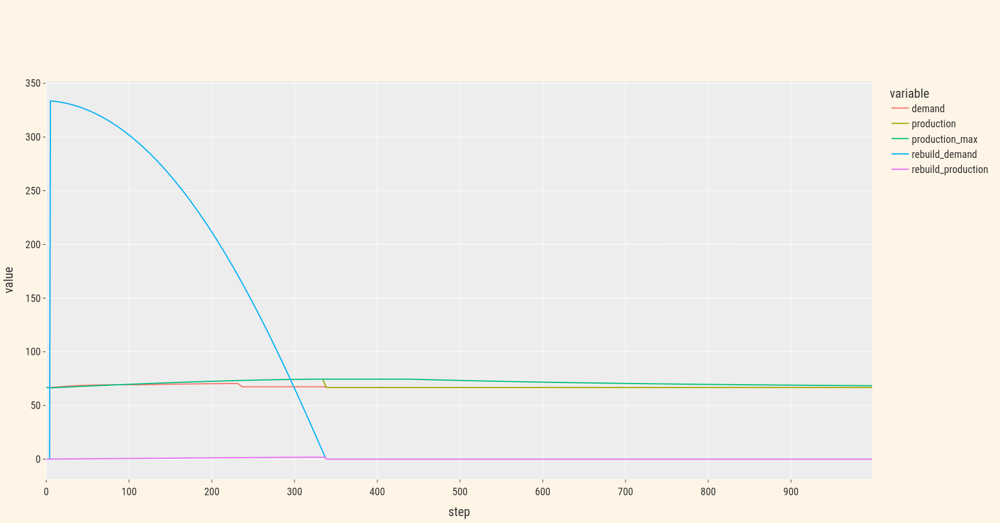

In [31]:
import plotly.express as px
tmp_df = df_prod[(df_prod.variable=='rebuild_demand') | (df_prod.variable=='rebuild_production') | (df_prod.variable=='demand') | (df_prod.variable=='production') | (df_prod.variable=='production_max')]
tmp_df = tmp_df[(tmp_df.sector=="Manufacture of construction products and cement")]
tmp_df = tmp_df[(tmp_df.region=="DE")]
tmp_df = tmp_df[['step','variable', 'value', 'pct']]
tmp_df = tmp_df.groupby(['step', 'variable']).mean()
tmp_df = tmp_df.reset_index()
tmp_df = pd.pivot(
  tmp_df,values=['value', 'pct'],
  index='step', #these stay as columns; will fail silently if any of these cols have null values
  columns='variable') #data values in this column become their own column

res = tmp_df['value']
#res.loc[:,'t_demand'] = tmp_df['value']['demand'] + tmp_df['value']['rebuild_demand']

fig = px.line(res, x=res.index, y=res.columns)

fig.update_layout(height=900)


fig.show()

/tmp/ipykernel_9199/2624447764.py:34: FutureWarning:

Dropping invalid columns in DataFrameGroupBy.min is deprecated. In a future version, a TypeError will be raised. Before calling .min, select only columns which should be valid for the function.



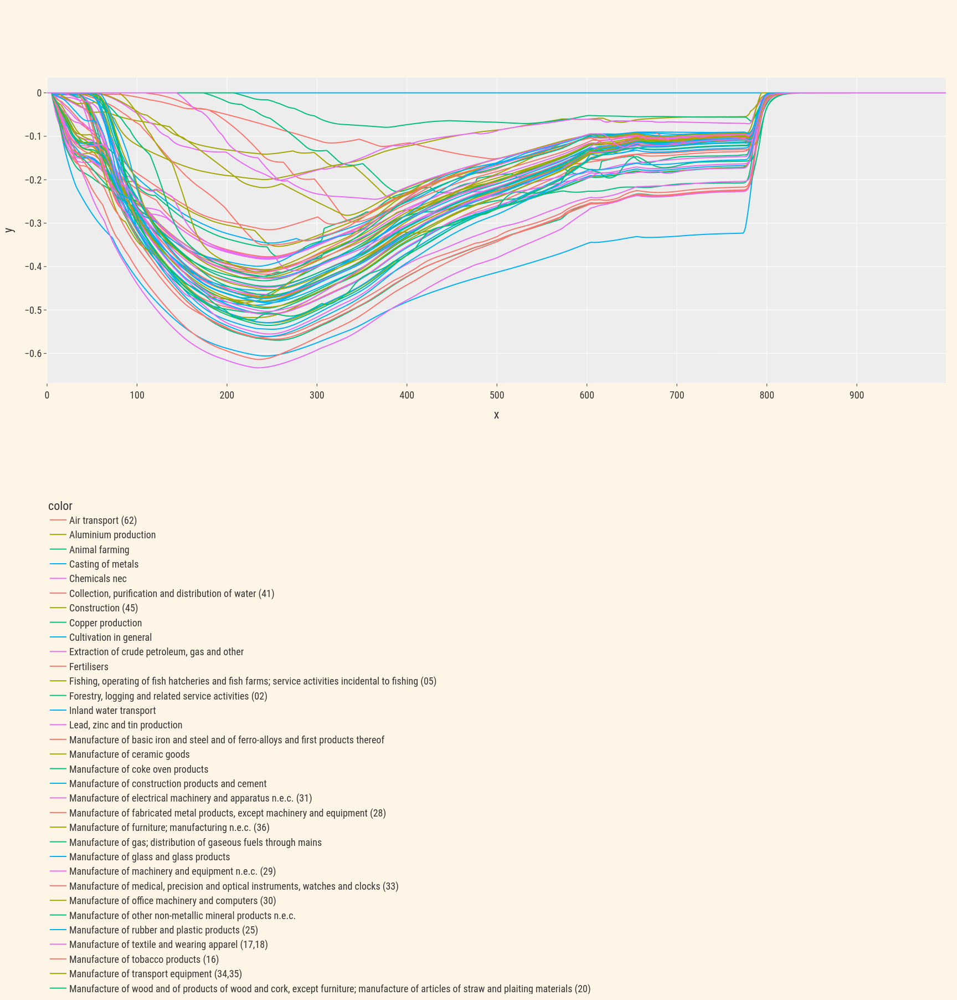

In [25]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio

pio.templates["econ"] = go.layout.Template(
layout = {
    # Fonts
    # Note - 'family' must be a single string, NOT a list or dict!
    'title':
        {'font': {'family': 'Roboto Condensed, bold', 
                  'size':24,
                  'color': '#333'}
        },
    'font': {'family': 'Roboto Condensed', 
                  'size':18,
                  'color': '#333'},
    # Colorways
    #'colorway': ['#ec7424', '#a4abab'],
    # Keep adding others as needed below
    'margin': {'l':20, 'r':20, 't':140, 'b':20},
    'paper_bgcolor':"#fff5e6",
    'width':1600,
    'height':1800,
    },
)
pio.templates["econ"].layout.autosize = False

px.defaults.template = "ggplot2+econ"

df_stocks = pd.read_parquet("../../../Data/Run_GER/outputs/results/DE_qdmg_148B_Psi_0_85_inv_tau_6/treated_df_stocks.parquet/")
df_stocks = df_stocks[df_stocks.region=='DE']
#df_stocks = df_stocks[df_stocks.sector=='Transmission and distribution of electricity']
#df_stocks
df_stocks = df_stocks.groupby(["step","stock of"]).min()
df_stocks = df_stocks.reset_index()
df_stocks
fig = px.line(x=df_stocks.step, y=df_stocks.value, color = df_stocks['stock of'])

fig.update_layout(legend=dict(
    yanchor="bottom",
    y=-2.0,
    xanchor="left",
    x=0.0
))

fig.show()

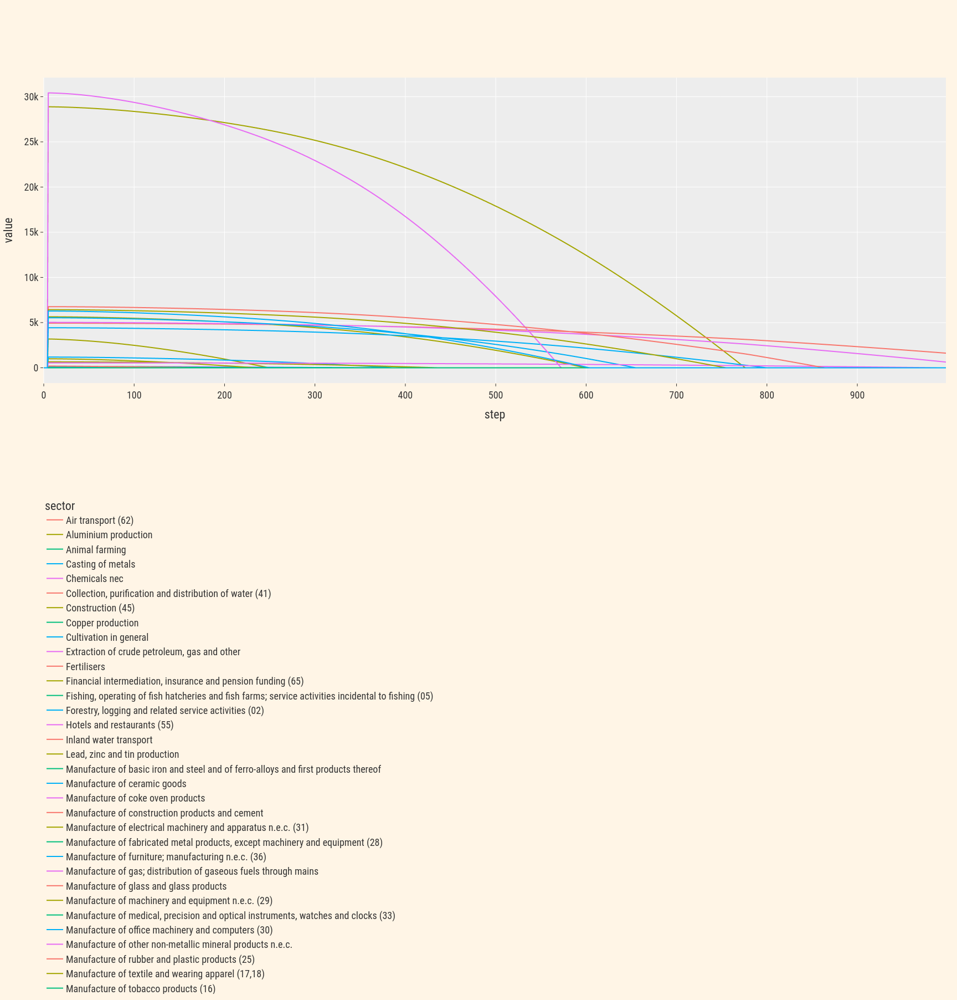

In [29]:
import plotly.express as px
tmp_df = df_prod[(df_prod.variable=='rebuild_demand')]
#tmp_df = tmp_df[(tmp_df.sector=="Manufacture of wood and of products of wood and cork, except furniture; manufacture of articles of straw and plaiting materials (20)")]
tmp_df = tmp_df[(tmp_df.region=="DE")]
tmp_df = tmp_df[['step', 'sector', 'value', 'pct']]
tmp_df = pd.pivot(
  tmp_df,values=['value', 'pct'],
  index='step', #these stay as columns; will fail silently if any of these cols have null values
  columns='sector') #data values in this column become their own column

res = tmp_df['value']

fig = px.line(res, x=res.index, y=res.columns)
fig.update_layout(legend=dict(
    yanchor="bottom",
    y=-2.0,
    xanchor="left",
    x=0.0
))
fig.show()

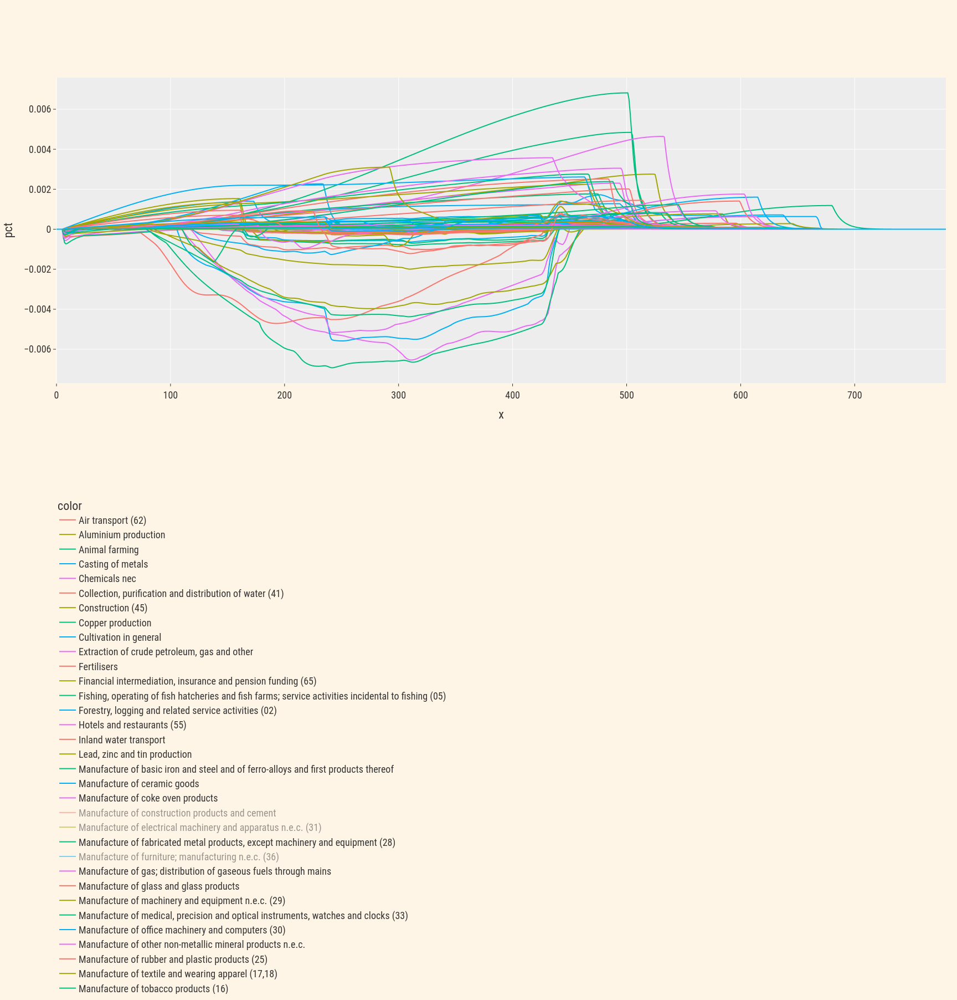

In [52]:
import plotly.express as px
tmp_df = df_prod[(df_prod.variable=='production')]
tmp_df = tmp_df[(tmp_df.region=="Rest of the world")]
tmp_df = tmp_df[['step', 'sector', 'value', 'pct']]
#tmp_df = pd.pivot(
#  tmp_df,values=['value', 'pct'],
#  index='step', #these stay as columns; will fail silently if any of these cols have null values
#  columns='variable') #data values in this column become their own column

#res = tmp_df['value']
tmp_df = tmp_df.groupby(['step','sector']).mean()

fig = px.line(tmp_df, x=tmp_df.index.get_level_values(0), y=tmp_df.pct, color=tmp_df.index.get_level_values(1))
fig.update_layout(legend=dict(
    yanchor="bottom",
    y=-2.0,
    xanchor="left",
    x=0.0
))
fig.show()

In [30]:
import plotly.express as px

df_stocks = pd.read_parquet("../../../Data/BigScaleTest/results/treated_df_stocks.parquet/")
df_stocks = df_stocks[df_stocks.region=='PL']
df_stocks = df_stocks[df_stocks.step<=600]
#df_stocks = df_stocks[df_stocks.sector=='Manufacture of gas; distribution of gaseous fuels through mains']
#df_stocks
df_stocks = df_stocks.groupby(["step","stock of"]).mean()
df_stocks = df_stocks.reset_index()
df_stocks
fig = px.line(x=df_stocks.step, y=df_stocks.value, color = df_stocks['stock of'])
fig.show()

In [2]:
import json

folder = "/home/sjuhel/Nextcloud/Thesis/Workbench/Data/Floods_Run_1/SI_qdmg_75%_Psi_0_9_inv_tau_60"
indexes_file = "/home/sjuhel/Nextcloud/Thesis/Workbench/Data/Floods_Run_1/indexes.json"

indic = Indicators.from_folder(folder, indexes_file)
indic

In [13]:
indic.df_limiting
a = indic.df_limiting.T.stack(level=0)
#a.index = a.index.rename(['step','sector', 'region']) #type: ignore
a[a.any(axis=1)]

stock of                                                        Air transport (62)  \
region sector                                             step                       
AT     Air transport (62)                                 128                False   
                                                          129                False   
                                                          130                False   
                                                          131                False   
                                                          132                False   
...                                                                            ...   
WE     Wholesale trade and commission trade, except of... 133                False   
                                                          134                False   
WF     Manufacture of electrical machinery and apparat... 132                False   
                                                          133                False   
                                                          134                False   

stock of                                                        Aluminium production  \
region sector                                             step                         
AT     Air transport (62)                                 128                  False   
                                                          129                  False   
                                                          130                  False   
                                                          131                  False   
                                                          132                  False   
...                                                                              ...   
WE     Wholesale trade and commission trade, except of... 133                  False   
                                                          134                  False   
WF     Manufacture of electrical machinery and apparat... 132                  False   
                                                          133                  False   
                                                          134                  False   

stock of                                                        Animal farming  \
region sector                                             step                   
AT     Air transport (62)                                 128            False   
                                                          129            False   
                                                          130            False   
                                                          131            False   
                                                          132            False   
...                                                                        ...   
WE     Wholesale trade and commission trade, except of... 133            False   
                                                          134            False   
WF     Manufacture of electrical machinery and apparat... 132            False   
                                                          133            False   
                                                          134            False   

stock of                                                        Casting of metals  \
region sector                                             step                      
AT     Air transport (62)                                 128               False   
                                                          129               False   
                                                          130               False   
                                                          131               False   
                                                          132               False   
...                                                                       

In [42]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

from ario3.simulation import Simulation
from ario3.indicators import Indicators
from ario3.logging_conf import DEBUGFORMATTER
import json
import pandas as pd
import numpy as np
import pathlib
import csv
import logging
import coloredlogs
import pickle
from datetime import datetime


#REGIONS = ['SI']

LOGPATH = "/home/sjuhel/Nextcloud/Thesis/Workbench/Data/Run_JP/outputs/logs"
LOGNAME = "run"

if __name__ == "__main__":
    print("=============== STARTING OF RUN GER RESULTS ================")
    logFormatter = DEBUGFORMATTER
    rootLogger = logging.getLogger(__name__)
    consoleHandler = logging.StreamHandler(sys.stderr)
    fileHandler = logging.FileHandler("{0}/{1}.log".format(LOGPATH, LOGNAME))
    fileHandler.setFormatter(logFormatter)
    rootLogger.addHandler(fileHandler)

    fieldstyle = {'asctime': {'color': 'green'},
              'levelname': {'bold': True, 'color': 'black'},
              'filename':{'color':'cyan'},
              'funcName':{'color':'blue'}}

    levelstyles = {'critical': {'bold': True, 'color': 'red'},
               'debug': {'color': 'green'},
               'error': {'color': 'red'},
               'info': {'color':'magenta'},
               'warning': {'color': 'yellow'}}

    coloredlogs.install(level=logging.DEBUG,
                    logger=rootLogger,
                    fmt='%(asctime)s [%(levelname)s] - [%(filename)s > %(funcName)s() > %(lineno)s] - %(message)s',
                    datefmt='%H:%M:%S',
                    field_styles=fieldstyle,
                    level_styles=levelstyles)

    rootLogger.info("Computing gdp dataframe")
    with open("/home/sjuhel/Nextcloud/Thesis/Workbench/Data/Run_JP/inputs/params.json") as f:
        params_template = json.load(f)

    with open("/home/sjuhel/Nextcloud/Thesis/Workbench/Data/Run_JP/inputs/event_template.json") as f:
        event_template = json.load(f)

    mrio_path = pathlib.Path(params_template['storage_dir'])/"inputs"/"exio3_japan_ROW.pkl"

    with mrio_path.open('rb') as f:
        mrio = pickle.load(f)

        res = [{
        "tot_fd_unmet": "unset",
        "aff_fd_unmet": "unset",
        "rebuild_durations": "unset",
        "shortage_b": False,
        "shortage_date_start": "unset",
        "shortage_date_end": "unset",
        "shortage_date_max": "unset",
        "shortage_ind_max": "unset",
        "shortage_ind_mean": "unset",
        "10_first_shortages": "unset",
        "prod_gain_tot": "unset",
        "prod_lost_tot": "unset",
        "prod_gain_unaff": "unset",
        "prod_lost_unaff": "unset",
        "region":"unset",
        "q_dmg":"unset",
        "pib": "unset",
        "psi": "unset",
        "inv_tau": "unset"
        }]
    rootLogger.info('Done !')
    rootLogger.info("Main storage dir is : {}".format(pathlib.Path(params_template['storage_dir']).resolve()))
    model = None
    for reg in ['Japan']:
        dmgs = { str(v)+"B" : v * 1000000000 for v in range(1,150,4) }
        for qdmg, v in dmgs.items():
            dmg = v
            event = event_template.copy()
            sim_params = params_template.copy()
            event['aff-regions'] = reg
            event['q_dmg'] = dmg
            psi = sim_params['psi_param']
            inv_tau = sim_params['inventory_restoration_time']
            sim_params["results_storage"] = params_template["results_storage"]+"/"+reg+'_'+'qdmg_'+qdmg+'_Psi_'+str(sim_params['psi_param']).replace(".","_")+"_inv_tau_"+str(sim_params['inventory_restoration_time'])
            del model
            model = Simulation(sim_params, mrio_path)
            model.read_events_from_list([event])
            try:
                model.loop(progress=False)
                indic = None
                try:
                    indic = Indicators.from_storage_path(pathlib.Path(sim_params['storage_dir']), params=sim_params)
                    indic.update_indicators()
                    res_a = indic.indicators.copy()
                    indic.write_indicators()
                    res_a['region'] = reg
                    res_a['q_dmg'] = event['q_dmg']
                    res_a['pib'] = v
                    res_a['psi'] = psi
                    res_a['inv_tau'] = inv_tau
                    res.append(res_a)
                except Exception:
                    rootLogger.exception("Indicators could not be computed:")
            except Exception:
                rootLogger.exception("There was a problem:")

    with (pathlib.Path(params_template['storage_dir'])/"outputs"/("indicators_"+datetime.now().strftime("%Y%m%d-%H%M")+".csv")).open('w') as f:
        w = csv.DictWriter(f, res[0].keys())
        w.writeheader()
        w.writerows(res)

15:27:06 [INFO] - [2057708106.py > <module>() > 53] - Computing gdp dataframe


=============== STARTING OF RUN GER RESULTS ================


15:27:07 [INFO] - [2057708106.py > <module>() > 86] - Done !
15:27:07 [INFO] - [2057708106.py > <module>() > 87] - Main storage dir is : /home/sjuhel/Nextcloud/Thesis/Workbench/Data/Run_JP
15:27:07 [INFO] - [simulation.py > __init__() > 57] - Initializing new simulation instance
15:27:07 [DEBUG] - [mriosystem.py > __init__() > 124] - Initiating new MrioSystem instance
15:27:07 [INFO] - [mriosystem.py > __init__() > 142] - Monetary unit is: 1000000
15:27:07 [INFO] - [simulation.py > __init__() > 129] - Initialized !
15:27:07 [INFO] - [simulation.py > read_events_from_list() > 275] - Reading events from given list and adding them to the model
15:27:07 [INFO] - [simulation.py > loop() > 146] - Starting model loop for at most 1000 steps
15:27:07 [INFO] - [simulation.py > loop() > 147] - One step is 1 day(s)
15:27:07 [INFO] - [simulation.py > loop() > 152] - Parameters : 
 {
    "storage_dir": "/home/sjuhel/Nextcloud/Thesis/Workbench/Data/Run_JP/",
    "results_storage": "outputs/results/Ja

In [37]:
indic = Indicators.from_storage_path(pathlib.Path(sim_params['storage_dir']), params=sim_params)

15:24:39 [INFO] - [indicators.py > __init__() > 30] - Instanciating indicators
15:24:43 [INFO] - [indicators.py > save_dfs() > 331] - Saving computed dataframe to results folder


In [40]:
sim_params

{'storage_dir': '/home/sjuhel/Nextcloud/Thesis/Workbench/Data/Run_GER/',
 'results_storage': 'outputs/results/Japan_qdmg_5B_Psi_0_85_inv_tau_6',
 'register_stocks': True,
 'psi_param': 0.85,
 'model_time_step': 1,
 'timestep_dividing_factor': 365,
 'inventory_restoration_time': 6,
 'alpha_base': 1.0,
 'alpha_max': 1.25,
 'alpha_tau': 365,
 'rebuild_tau': 10000,
 'n_timesteps': 1000,
 'min_duration': 1000,
 'impacted_region_base_production_toward_rebuilding': 0.001,
 'row_base_production_toward_rebuilding': 0.0,
 'mrio_params_file': '/home/sjuhel/Nextcloud/Thesis/Workbench/Data/BigScaleTest/mrio_params_2.json',
 'n_timesteps_simulated': 1000,
 'has_crashed': False}